DATA SOURCE: https://github.com/beoutbreakprepared/nCoV2019/tree/master/latest_data
    

        

Problem Statement <br>
The goal of this case study is to use the patient details like age, sex, symptoms and predict if the patient will recover or not.

# imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


import statsmodels.api as sm 
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import r2_score

In [2]:
import warnings
warnings.filterwarnings("ignore")

# Utility functions

In [3]:
def missing_plot(df):
    fig, ax = plt.subplots(figsize=(20, 6))
    sns.heatmap(df.isnull(), cbar=False, yticklabels=False)
    plt.title("Missing values after initial data treatment")
    plt.show()

In [4]:
def missing_print_percentages(df):
    # Print missing percentage of only columns with missing values
    missing_columns = df.columns[df.isnull().any()]
    missing_count = df[missing_columns].isnull().sum() 
    print(missing_columns)
    return pd.concat({
                    "Missing": missing_count, 
                    "Missing %": missing_count/len(df.index)*100
                   } , 
                   axis = 1).sort_values(by = 'Missing', ascending = False)

# Load data - nCov2019

In [6]:
data = pd.read_csv("data/nCov2019/latestdata.csv")

In [7]:
data.shape

(2676311, 33)

# Check missing

In [8]:
#missing_plot(data)
missing_print_percentages(data)

Index(['age', 'sex', 'city', 'province', 'country', 'latitude', 'longitude',
       'geo_resolution', 'date_onset_symptoms', 'date_admission_hospital',
       'date_confirmation', 'symptoms', 'lives_in_Wuhan',
       'travel_history_dates', 'travel_history_location',
       'reported_market_exposure', 'additional_information', 'chronic_disease',
       'source', 'sequence_available', 'outcome', 'date_death_or_discharge',
       'notes_for_discussion', 'location', 'admin3', 'admin2', 'admin1',
       'country_new', 'admin_id', 'data_moderator_initials',
       'travel_history_binary'],
      dtype='object')


,Missing,Missing %
sequence_available,2676299,99.999552
chronic_disease,2676096,99.991967
notes_for_discussion,2675671,99.976086
reported_market_exposure,2675242,99.960057
symptoms,2674259,99.923327
travel_history_dates,2673700,99.902440
date_death_or_discharge,2673163,99.882375
lives_in_Wuhan,2671973,99.837911
travel_history_location,2667089,99.655421
location,2662935,99.500208


In [9]:
data.shape

(2676311, 33)

In [10]:
# inspect columns
col = 'location'
ncov19data[~ncov19data[col].isnull()][col].head(5)

0                                    Shek Lei
1                                 Vo' Euganeo
52                Pixel Park, Jinkai District
54                Pixel Park, Jinkai District
57    Dashun Community, Dongling South Street
Name: location, dtype: object

# Drop columns that are not required

In [11]:
data.shape

(2676311, 33)

In [12]:
columns_to_drop = ['ID','notes_for_discussion','admin1','admin2','admin3','additional_information','province','data_moderator_initials','geo_resolution','travel_history_dates','travel_history_location','latitude','longitude','chronic_disease','source','sequence_available','location','admin_id','country_new','city', 'date_onset_symptoms', 'date_admission_hospital',
       'date_confirmation', 'lives_in_Wuhan', 'reported_market_exposure',
       'date_death_or_discharge','country']
data = data.drop(columns_to_drop, axis = 1)

In [13]:
data.shape

(2676311, 6)

In [14]:
data.columns

Index(['age', 'sex', 'symptoms', 'chronic_disease_binary', 'outcome',
       'travel_history_binary'],
      dtype='object')

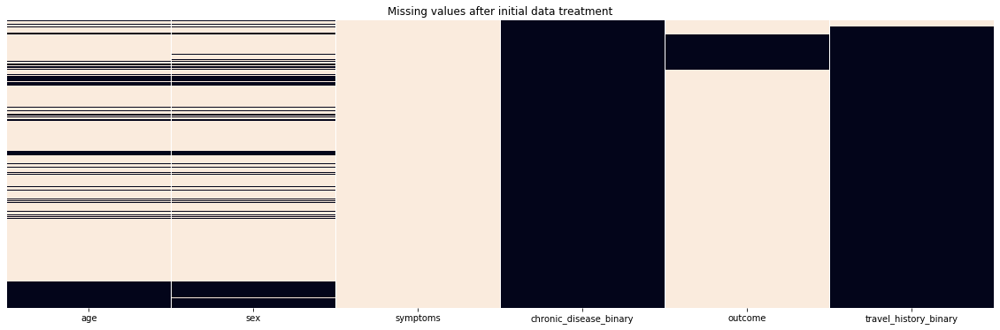

In [15]:
missing_plot(data)

In [16]:
missing_print_percentages(data)

Index(['age', 'sex', 'symptoms', 'outcome', 'travel_history_binary'], dtype='object')


,Missing,Missing %
symptoms,2674259,99.923327
outcome,2368929,88.514713
age,2098293,78.402435
sex,2096154,78.322512
travel_history_binary,65579,2.450351


# Create data - with symptoms, recovered & age

In [17]:
finaldata = data[(~data['symptoms'].isnull()) & (~data['outcome'].isnull()) & (~data['age'].isnull())]

In [18]:
finaldatabk=finaldata

In [19]:
finaldata.shape

(215, 6)

In [20]:
missing_print_percentages(finaldata)

Index(['travel_history_binary'], dtype='object')


,Missing,Missing %
travel_history_binary,79,36.744186


# Fill missing values

## Set travel history as false if it is not available in the data

In [21]:
finaldata['travel_history_binary'].fillna(False,inplace = True)

In [22]:
finaldata.shape

(215, 6)

In [23]:
missing_print_percentages(finaldata)

Index([], dtype='object')


,Missing,Missing %


# Create symptoms columns

In [24]:
finaldata['symptoms'].unique()
expected_symptoms = ['severe','acute']
finaldata[finaldata['symptoms'].str.contains('cardio') ]['symptoms']

223449    septic shock:cardiogenic shock:acute respirato...
231339    cardiogenic shock:acute coronary syndrome:hear...
236027    cardiopulmonary arrest; acute respiratory fail...
242561    cardiopulmonary arrest: acute respiratory dist...
Name: symptoms, dtype: object

In [25]:
def has_symptoms(expected_symptoms,actual_symptoms):
    return 1 if any(expected_symptom in actual_symptoms for expected_symptom in expected_symptoms) else  0

    

In [26]:
finaldata['fever'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['fever'],x))
finaldata['cold_cough'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['cold','cough','runny nose','sore throat','chills','sputum'],x))
finaldata['bodyache'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['myalgia','mialgia','headache'],x))
finaldata['pneumonia'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['pneumonia'],x))
finaldata['fatigue'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['fatigue','weakness','difficulty breathing','malaise'],x))
finaldata['asymptomatic'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['asymptomatic','none'],x))
finaldata['respiratory'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['respiratory'],x))
finaldata['chest_distress'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['chest'],x))
#finaldata['acute_respiratory'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['acute respiratory'],x))
#finaldata['acute_severe'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['acute','severe'],x))
finaldata['kidney_symptom'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['kidney'],x))
finaldata['heart_symptom'] = finaldata['symptoms'].apply(lambda x: has_symptoms(['heart','cardio','cardiac'],x))

# Create target column from outcome

In [27]:
finaldata.shape

(215, 16)

In [28]:
def has_recovered(outcome):
    return 0 if any(deceased_outcome in outcome for deceased_outcome in ['death','dead','died','Deceased'] ) else 1

In [29]:
finaldata['recovered'] = finaldata['outcome'].apply(lambda x: has_recovered(x))

# Convert age to numeric

In [30]:
# Convert age to integer type

def generalise_age(val):
    age = val
    if val == '80-89':
        age = 80
    elif val == '60-69':
        age = 60
    elif val == '50-59':
        age = 50
    elif val == '15-88':
        age = (15+88)/2
    elif val == '0.25':
        age = 0
    return int(age)

finaldata['age'] = finaldata['age'].apply(lambda x: generalise_age(x))

In [31]:
# Create age_groups
def create_age_group(age):
    age_group = '0-25'
    if (age > 25 and age <= 35):
        age_group = '25-35'
    elif (age > 35 and age <= 45):
        age_group = '35-45'
    elif (age > 45 and age <= 55):
        age_group = '45-55'
    elif (age > 55 and age <= 65):
        age_group = '55-65'
    elif (age > 65 and age <= 70):
        age_group = '65-70'
    elif (age > 70 and age <= 75):
        age_group = '70-75'
    elif (age > 75 and age <= 80):
        age_group = '75-80'
    elif (age > 80):
        age_group = '80-95'
        
    return age_group

finaldata['age_group'] = finaldata['age'].apply(lambda x: create_age_group(x))

# Convert binary columns

In [32]:
finaldata['sex'].unique()

array(['female', 'male'], dtype=object)

In [33]:
finaldata['is_male'] = finaldata['sex'].map({'male':1,'female':0})

In [34]:
finaldata['travel_history_binary'].unique()

array([False,  True])

In [35]:
finaldata['chronic_disease'] = finaldata['chronic_disease_binary'].map({True:1,False:0})

In [36]:
finaldata['travel_history'] = finaldata['travel_history_binary'].map({True:1,False:0})

# drop the converted columns

In [37]:
finaldata.drop(['sex','outcome','symptoms','chronic_disease_binary','travel_history_binary'],axis=1,inplace=True)

In [38]:
finaldata.shape

(215, 16)

In [39]:
display(finaldata.head())

,age,fever,cold_cough,bodyache,pneumonia,fatigue,asymptomatic,respiratory,chest_distress,kidney_symptom,heart_symptom,recovered,age_group,is_male,chronic_disease,travel_history
3223,44,1,0,0,0,1,0,0,0,0,0,1,35-45,0,0,0
3335,39,1,1,0,0,1,0,0,0,0,0,1,35-45,0,0,0
3446,46,1,0,0,0,0,0,0,0,0,0,1,45-55,1,0,0
3668,40,1,1,0,1,0,0,0,0,0,0,1,35-45,1,0,0
3779,30,1,1,0,0,0,0,0,0,0,0,1,25-35,1,0,0


# Variables

In [40]:
DEPENDENT_VARIABLE = 'recovered'
INDEPENDENT_VARIABLES = ['age', 'fever', 'cold_cough', 'bodyache', 'pneumonia', 'fatigue',
       'asymptomatic', 'respiratory', 'chest_distress', 
       'kidney_symptom', 'heart_symptom',  'is_male',
       'chronic_disease', 'travel_history']
CATEGORICAL_VARIABLES_PLOT = ['age_group','is_male','chronic_disease','pneumonia','asymptomatic']

In [41]:
finaldata.columns

Index(['age', 'fever', 'cold_cough', 'bodyache', 'pneumonia', 'fatigue',
       'asymptomatic', 'respiratory', 'chest_distress', 'kidney_symptom',
       'heart_symptom', 'recovered', 'age_group', 'is_male', 'chronic_disease',
       'travel_history'],
      dtype='object')

# EDA

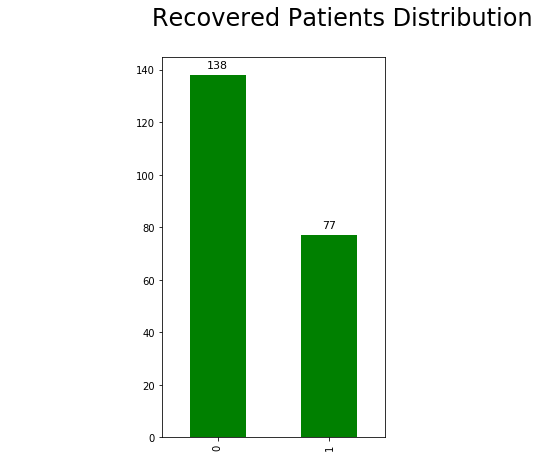

In [43]:
fig = plt.figure(figsize=(4,7))
fig.suptitle('                   Recovered Patients Distribution', fontsize=24)
ax = finaldata['recovered'].value_counts().plot.bar(color = 'green')
for p in ax.patches: 
    ax.annotate("%0.0f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11,  xytext=(0, 10), textcoords='offset points')

In [44]:
finaldata.columns

Index(['age', 'fever', 'cold_cough', 'bodyache', 'pneumonia', 'fatigue',
       'asymptomatic', 'respiratory', 'chest_distress', 'kidney_symptom',
       'heart_symptom', 'recovered', 'age_group', 'is_male', 'chronic_disease',
       'travel_history'],
      dtype='object')

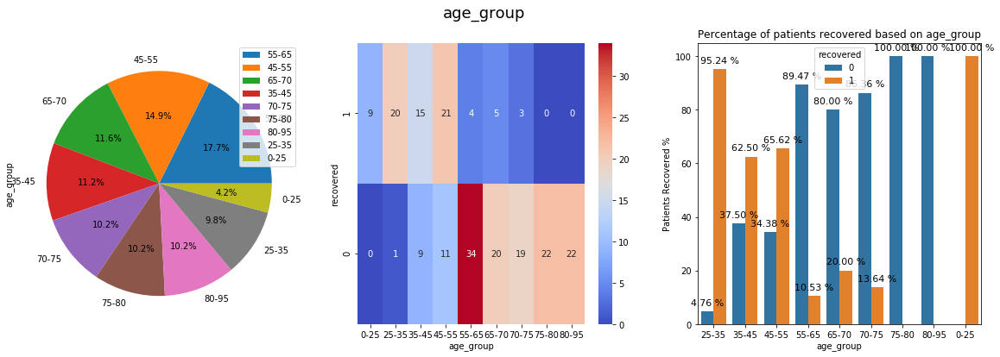

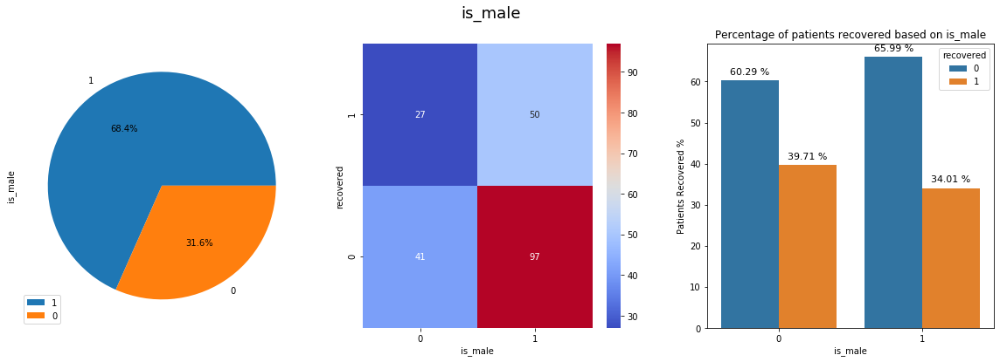

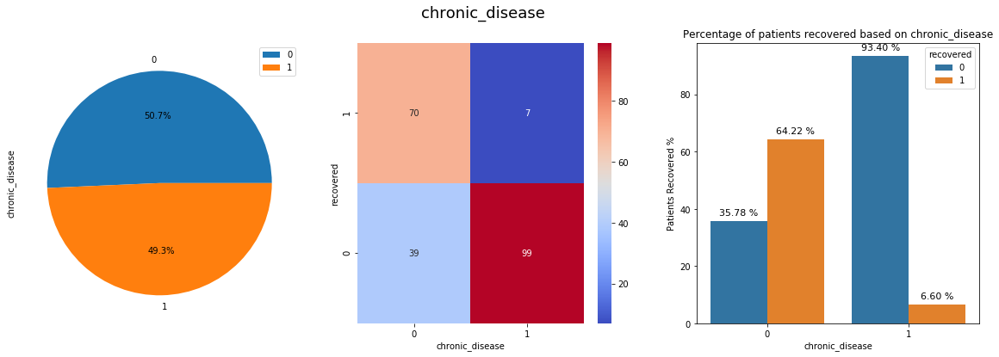

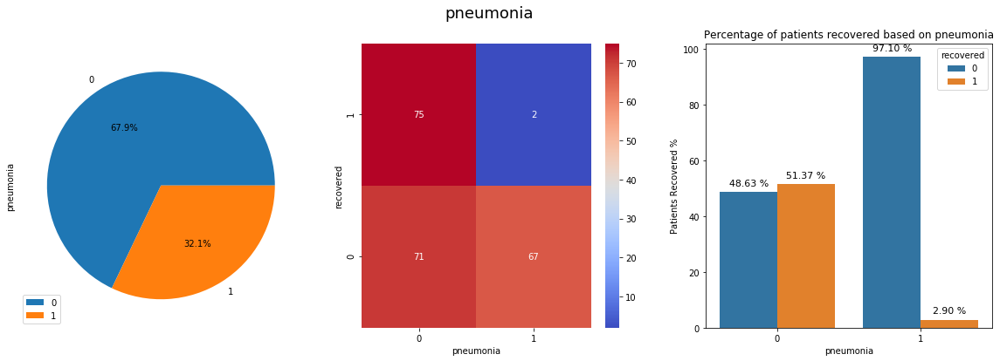

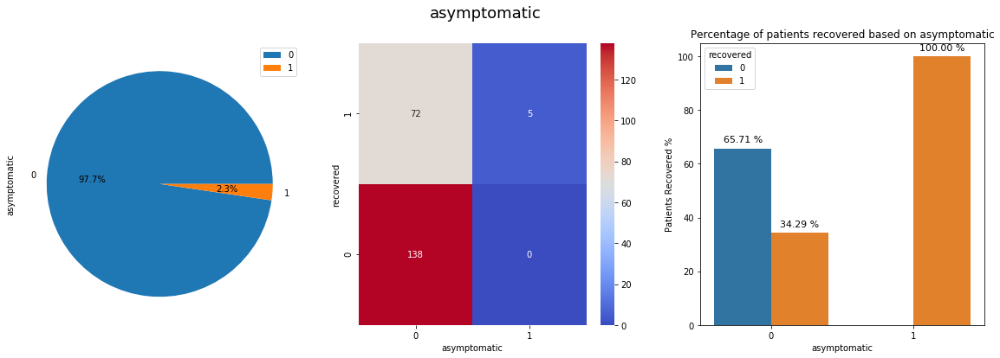

In [45]:
# For each categorical variable, plot
# 1. Percentage distribution of each category - Univariate Analysis
# 2. Heatmap of each category against the target variable - Segmented Univariate Analysis
# 3. Grouped bar chart of each category against the target variable - Segmented Univariate Analysis

for col in CATEGORICAL_VARIABLES_PLOT:
    fig, ax = plt.subplots(1, 3, figsize=(20, 6))
    fig.suptitle(col, fontsize=18)
    # Chart 1
    finaldata[col].value_counts().plot.pie(ax=ax[0], autopct="%1.1f%%")
    ax[0].legend()
    # Chart 2
    sns.heatmap(pd.crosstab(index=finaldata[DEPENDENT_VARIABLE], columns=finaldata[col]), ax=ax[1], cmap='coolwarm', annot=True, fmt='d') #, annot_kws=akws
    ax[1].set_ylim([0,2])
    # Chart 3 - grouped bar chart
    group_df = pd.DataFrame((finaldata.groupby([DEPENDENT_VARIABLE,col]).size()/finaldata.groupby([col]).size()*100).to_frame('count'))
    group_df.reset_index(inplace=True) 
    sns.barplot(x=group_df[col], y=group_df['count'], hue=group_df[DEPENDENT_VARIABLE], ax=ax[2])
    ax[2].set(xlabel=col, ylabel='Patients Recovered %',title = f'Percentage of patients recovered based on {col}') 

    #annotate axis = seaborn axis
    for p in ax[2].patches:
                 ax[2].annotate("%.2f %%" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='center', fontsize=11,  xytext=(0, 10),
                     textcoords='offset points')


    plt.yticks(rotation = 0)
    plt.show()

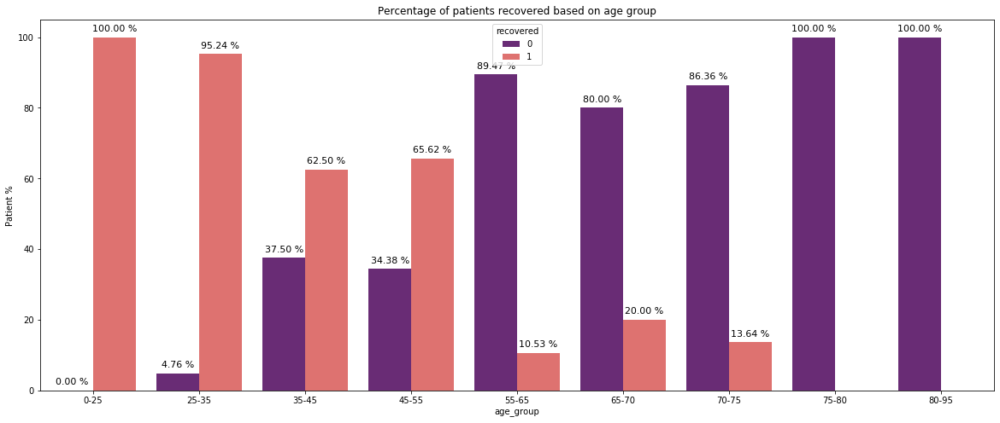

In [46]:
# Analysis only on age_group versus recovered flag
        
col = 'age_group'
fig, ax = plt.subplots(figsize=(20, 8))
group_df = pd.DataFrame((finaldata.groupby([DEPENDENT_VARIABLE,col]).size()/finaldata.groupby([col]).size()*100).to_frame('count'))
group_df.reset_index(inplace=True) 

new_row = pd.DataFrame({'age_group': '0-25', 'recovered': 0, 'count': 0} ,   index =[0]) 
group_df = pd.concat([new_row, group_df]).reset_index(drop = True) 

sns.barplot(x=group_df[col], y=group_df['count'], hue=group_df[DEPENDENT_VARIABLE],palette = 'magma')
ax.set(xlabel=col, ylabel='Patient %',title = 'Percentage of patients recovered based on age group') 

#annotate axis = seaborn axis
for p in ax.patches:
             ax.annotate("%.2f %%" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', fontsize=11,  xytext=(0, 10),
                 textcoords='offset points')


plt.yticks(rotation = 0)
plt.show()

In [47]:
# Heat Map - few variables
corr = finaldata[['age','is_male','chronic_disease','pneumonia','recovered']].corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(1)

,age,is_male,chronic_disease,pneumonia,recovered
age,1,0.06,0.5,0.3,-0.7
is_male,0.06,1,0.07,0.1,-0.06
chronic_disease,0.5,0.07,1,0.5,-0.6
pneumonia,0.3,0.1,0.5,1,-0.5
recovered,-0.7,-0.06,-0.6,-0.5,1


In [48]:
# Heat Map
corr = finaldata.corr()
corr.style.background_gradient(cmap='coolwarm').set_precision(1)

,age,fever,cold_cough,bodyache,pneumonia,fatigue,asymptomatic,respiratory,chest_distress,kidney_symptom,heart_symptom,recovered,is_male,chronic_disease,travel_history
age,1,-0.3,-0.3,-0.2,0.3,-0.03,-0.2,0.3,0.05,0.06,0.1,-0.7,0.06,0.5,-0.02
fever,-0.3,1,0.6,0.2,-0.5,0.09,-0.1,-0.5,0.1,-0.2,-0.2,0.4,-0.04,-0.4,-0.4
cold_cough,-0.3,0.6,1,0.3,-0.5,0.03,-0.1,-0.4,0.04,-0.1,-0.2,0.4,-0.04,-0.3,-0.2
bodyache,-0.2,0.2,0.3,1,-0.2,0.08,-0.03,-0.1,-0.05,-0.04,-0.05,0.2,0.008,-0.1,-0.05
pneumonia,0.3,-0.5,-0.5,-0.2,1,-0.2,-0.1,0.5,-0.1,-0.01,0.2,-0.5,0.1,0.5,0.3
fatigue,-0.03,0.09,0.03,0.08,-0.2,1,-0.05,-0.2,0.01,-0.06,-0.07,0.1,-0.06,-0.2,-0.07
asymptomatic,-0.2,-0.1,-0.1,-0.03,-0.1,-0.05,1,-0.1,-0.03,-0.03,-0.04,0.2,0.04,-0.2,0.03
respiratory,0.3,-0.5,-0.4,-0.1,0.5,-0.2,-0.1,1,-0.1,0.2,0.09,-0.4,0.07,0.4,0.2
chest_distress,0.05,0.1,0.04,-0.05,-0.1,0.01,-0.03,-0.1,1,-0.04,-0.05,-0.01,-0.06,0.03,-0.1
kidney_symptom,0.06,-0.2,-0.1,-0.04,-0.01,-0.06,-0.03,0.2,-0.04,1,-0.04,-0.1,-0.04,0.2,-0.03


In [365]:
#sns.pairplot(finaldata)

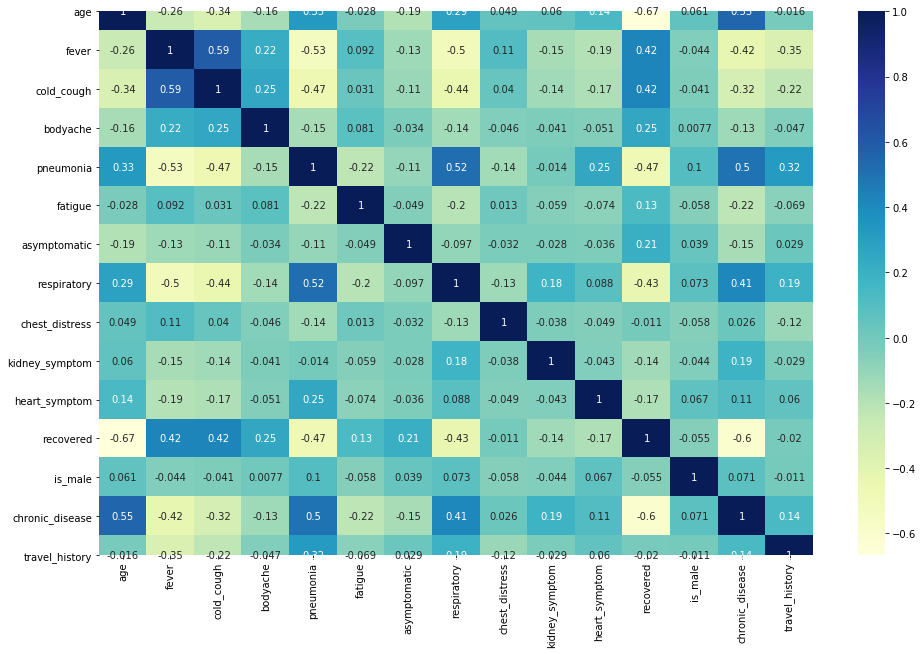

In [49]:
# Check the correlation coefficients to see which variables are highly correlated

plt.figure(figsize = (16, 10))
sns.heatmap(finaldata.corr(), annot = True, cmap="YlGnBu")
plt.show()

In [50]:
finaldata.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 215 entries, 3223 to 614705
Data columns (total 16 columns):
age                215 non-null int64
fever              215 non-null int64
cold_cough         215 non-null int64
bodyache           215 non-null int64
pneumonia          215 non-null int64
fatigue            215 non-null int64
asymptomatic       215 non-null int64
respiratory        215 non-null int64
chest_distress     215 non-null int64
kidney_symptom     215 non-null int64
heart_symptom      215 non-null int64
recovered          215 non-null int64
age_group          215 non-null object
is_male            215 non-null int64
chronic_disease    215 non-null int64
travel_history     215 non-null int64
dtypes: int64(15), object(1)
memory usage: 28.6+ KB


In [51]:
finaldata.shape

(215, 16)

In [52]:
finaldata.columns

Index(['age', 'fever', 'cold_cough', 'bodyache', 'pneumonia', 'fatigue',
       'asymptomatic', 'respiratory', 'chest_distress', 'kidney_symptom',
       'heart_symptom', 'recovered', 'age_group', 'is_male', 'chronic_disease',
       'travel_history'],
      dtype='object')

# Split - train - test

In [53]:
#X = finaldata.drop([DEPENDENT_VARIABLE],axis=1)
X = finaldata[INDEPENDENT_VARIABLES]
y = finaldata[DEPENDENT_VARIABLE]

In [54]:
# 70% of data used as train data and the remaining 30% as test data
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3, random_state=100)

In [55]:
X_train.shape

(150, 14)

In [56]:
X_test.shape

(65, 14)

# Logistic Regression

In [58]:
lr_sklearn_all = LogisticRegression() 
  
# Fit the model on the train dataset using sklearn
lr_sklearn_all.fit(X_train, y_train) 
# Predict the values on the test dataset using sklearn
y_pred_sklearn_all = lr_sklearn_all.predict(X_test)
r2_score(y_test, y_pred_sklearn_all)

0.6388888888888888

In [59]:
y_pred_sklearn_all

array([0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0])

In [60]:
from lime.lime_tabular import LimeTabularExplainer
model = lr_sklearn_all
predict_fn = lambda x: lr_sklearn_all.predict_proba(x).astype(float)
# Create the LIME explainer
explainer = LimeTabularExplainer(X_train.values,  
    mode='classification',feature_names=X_train.columns,class_names=model.classes_ )



In [61]:
# Explanation from lime - observation 1
i = 1
lime_explanation = explainer.explain_instance(X_test.values[i], predict_fn, num_features=10)
lime_explanation.show_in_notebook(show_table=True)

In [62]:
# Explanation from lime - observation 3
i = 3
lime_explanation = explainer.explain_instance(X_test.values[i], predict_fn, num_features=10)
lime_explanation.show_in_notebook(show_table=True)

# DECISION TREE CLASSIFIER

In [63]:
from sklearn.tree import DecisionTreeClassifier
dtmodel = DecisionTreeClassifier() 
# Fit the model on the train dataset using sklearn
dtmodel.fit(X_train, y_train) 
# Predict the values on the test dataset using sklearn
y_pred_dt = dtmodel.predict(X_test)
r2_score(y_test, y_pred_dt)

0.8555555555555556

In [67]:
from lime.lime_tabular import LimeTabularExplainer
model = dtmodel
dtpredict_fn = lambda x: model.predict_proba(x).astype(float)
# Create the LIME explainer
dtexplainer = LimeTabularExplainer(X_train.values,  
    mode='classification',feature_names=X_train.columns,class_names=model.classes_ )


In [68]:
# Explanation from LIME - observation 1
i = 1
lime_explanation = dtexplainer.explain_instance(X_test.values[i], dtpredict_fn, num_features=10)
lime_explanation.show_in_notebook(show_table=True)

In [69]:
# Explanation from LIME - observation 3
i = 3
lime_explanation = dtexplainer.explain_instance(X_test[INDEPENDENT_VARIABLES].values[i], dtpredict_fn, num_features=10)
lime_explanation.show_in_notebook(show_table=True)

# RANDOM FOREST

In [83]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import r2_score
# Create a random forest classifier and fit the training data
rfmodel = RandomForestClassifier().fit(X_train, y_train) 
# Predict the values on the test dataset using sklearn
y_pred_rf = rfmodel.predict(X_test)
r2_score(y_test, y_pred_rf)

0.7833333333333333

In [84]:
X_train.columns

Index(['age', 'fever', 'cold_cough', 'bodyache', 'pneumonia', 'fatigue',
       'asymptomatic', 'respiratory', 'chest_distress', 'kidney_symptom',
       'heart_symptom', 'is_male', 'chronic_disease', 'travel_history'],
      dtype='object')

In [88]:
from lime.lime_tabular import LimeTabularExplainer
model = rfmodel
rfpredict_fn = lambda x: model.predict_proba(x).astype(float)
# Create the Lime Explainer for tabular data
rfexplainer = LimeTabularExplainer(X_train.values,  
    mode='classification',feature_names=X_train.columns,class_names=model.classes_ )


In [89]:
# Explanation from LIME model for observation 1
observation = 1
# Set the predict function for the model
predict_fn = lambda x: rfmodel.predict_proba(x).astype(float)
# Explain the prediction
lime_explanation = rfexplainer.explain_instance(X_test.values[observation], rfpredict_fn, num_features=10)
# Show the explanation in the notebook
lime_explanation.show_in_notebook(show_table=True)

In [ ]:
# Explanation from LIME model for observation 3
observation = 
# Set the predict function for the model
predict_fn = lambda x: rfmodel.predict_proba(x).astype(float)
# Explain the prediction
lime_explanation = rfexplainer.explain_instance(X_test.values[observation], rfpredict_fn, num_features=10)
# Show the explanation in the notebook
lime_explanation.show_in_notebook(show_table=True)

In [272]:
#### TESTING -  DISCRETIZE CONTINUOUS FALSE
#from lime.lime_tabular import LimeTabularExplainer
model = rfmodel_all
rfpredict_fn = lambda x: model.predict_proba(x).astype(float)
rfexplainer1 = LimeTabularExplainer(X_train.values,  
    mode='classification',feature_names=X_train.columns,class_names=model.classes_ ,discretize_continuous=False)


# explanation from LIME model
i = 1
lime_explanation = rfexplainer1.explain_instance(X_test.values[i], rfpredict_fn, num_features=10,)
lime_explanation.show_in_notebook(show_table=True)

4DEBUG: scaler after fit:mean - [5.70600000e+01 4.26666667e-01 3.66666667e-01 6.00000000e-02
 2.73333333e-01 8.66666667e-02 2.66666667e-02 2.80000000e-01
 4.66666667e-02 4.66666667e-02 4.66666667e-02 6.93333333e-01
 4.53333333e-01 5.00000000e-01],scale = [19.29291062  0.49459299  0.48189441  0.23748684  0.44567053  0.28134597
  0.16110728  0.44899889  0.21092389  0.21092389  0.21092389  0.46110977
  0.49781746  0.5       ]
4DEBUG: scaler after loop:mean - [5.70600000e+01 4.26666667e-01 3.66666667e-01 6.00000000e-02
 2.73333333e-01 8.66666667e-02 2.66666667e-02 2.80000000e-01
 4.66666667e-02 4.66666667e-02 4.66666667e-02 6.93333333e-01
 4.53333333e-01 5.00000000e-01],scale = [19.29291062  0.49459299  0.48189441  0.23748684  0.44567053  0.28134597
  0.16110728  0.44899889  0.21092389  0.21092389  0.21092389  0.46110977
  0.49781746  0.5       ]
4DEBUG: LOCAL Jupyter docker - [73  0  0  0  1  0  0  0  0  0  0  1  1  1]
4DEBUG - after data_inverse. Data_row:[73  0  0  0  1  0  0  0  0  0  

4DEBUG: LIME FEATURE SELECTION. num_features:5,feature_selection:forward_selection,used_features:[ 0 12  4  2 13]
4DEBUG: LIME FEATURE SELECTION. num_features:5,feature_selection:highest_weights,used_features:[ 4  0 12 13  2]
4DEBUG: LIME FEATURE SELECTION. num_features:5,feature_selection:auto,used_features:[ 0 12  4  2 13]
4DEBUG: LIME FEATURE SELECTION. num_features:5,feature_selection:none,used_features:[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13]
4DEBUG: OUTPUT. intercept:{1: 0.34387212686757923}
4DEBUG: OUTPUT. local_exp:{1: [(0, -0.11395193782564714), (12, -0.07339175384128671), (4, -0.0646642165594086), (2, 0.05737207810747079), (13, 0.04432425606451621), (7, -0.03738104034592984), (1, 0.03026484898992732), (11, -0.016188693948278432), (8, -0.0039425448675272845), (5, -0.0036686174054571044)]}
4DEBUG: OUTPUT. score:0.3445398539138421
4DEBUG: OUTPUT. local_pred:[0.05280466]


In [389]:
# Explanation from LIME model for observation 3
observation = 3
# Set the predict function for the model
predict_fn = lambda x: rfmodel.predict_proba(x).astype(float)
# Explain the prediction
lime_explanation = rfexplainer.explain_instance(X_test.values[observation], rfpredict_fn, num_features=10)
# Show the explanation in the notebook
lime_explanation.show_in_notebook(show_table=True)

4DEBUG: LOCAL Jupyter docker - [39  1  1  0  0  1  0  0  0  0  0  0  0  1]
4DEBUG - after data_inverse. Data_row:[39  1  1  0  0  1  0  0  0  0  0  0  0  1], num_samples:5000
data(<class 'numpy.ndarray'>) - Shape:(5000, 14),size:(5000, 14),10 rows:
    0    1    2    3    4    5    6    7    8    9    10   11   12   13
0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
1  0.0  0.0  1.0  1.0  0.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0  0.0
2  0.0  0.0  0.0  1.0  0.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0
3  0.0  0.0  1.0  1.0  0.0  0.0  0.0  0.0  1.0  1.0  1.0  1.0  0.0  0.0
4  0.0  1.0  0.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  0.0
5  1.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  0.0  0.0  0.0
6  0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  1.0  0.0
7  0.0  0.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  0.0  0.0
8  0.0  1.0  0.0  1.0  1.0  0.0  1.0  1.0  1.0  1.0  1.0  0.0  1.0  1.0
9  0.0  0.0  0.0  1.0  1.0  0.0

In [243]:
pd.options.display.max_seq_items = 2000
pd.options.display.max_rows = 100
pd.options.display.max_columns = 100

In [263]:
## TEST -limebase updated
# explanation from LIME model
i = 1
lime_explanation = rfexplainer.explain_instance(X_test.values[i], rfpredict_fn, num_features=10)
lime_explanation.show_in_notebook(show_table=True)

4DEBUG: LOCAL Jupyter docker - [73  0  0  0  1  0  0  0  0  0  0  1  1  1]
4DEBUG - after data_inverse. Data_row:[73  0  0  0  1  0  0  0  0  0  0  1  1  1], num_samples:5000
data(<class 'numpy.ndarray'>) - Shape:(5000, 14),size:(5000, 14),10 rows:[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 0. 0. 1.]
 [0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1.]
 [0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 1. 0. 1. 1. 1. 1. 0. 1. 1. 0. 1.]
 [0. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 0. 0. 0.]
 [0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.]
 [1. 1. 0. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0.]]
inverse(<class 'numpy.ndarray'>) - Shape:(5000, 14),size:(5000, 14),10 rows:[[73.          0.          0.          0.          1.          0.
   0.          0.          0.          0.          0.          1.
   1.          1.        ]
 [54.37137231  0.          1.          0.          0.          0.


# DEBUG - LIME

In [268]:
"""
Functions for explaining classifiers that use tabular data (matrices).
"""
import collections
import copy
from functools import partial
import json
import warnings

import numpy as np
import scipy as sp
import sklearn
import sklearn.preprocessing
from sklearn.utils import check_random_state

from lime.discretize import QuartileDiscretizer
from lime.discretize import DecileDiscretizer
from lime.discretize import BaseDiscretizer
from lime.discretize import StatsDiscretizer
from lime import explanation
#from lime import lime_base


class TableDomainMapper(explanation.DomainMapper):
    """Maps feature ids to names, generates table views, etc"""

    def __init__(self, feature_names, feature_values, scaled_row,
                 categorical_features, discretized_feature_names=None,
                 feature_indexes=None):
        """Init.

        Args:
            feature_names: list of feature names, in order
            feature_values: list of strings with the values of the original row
            scaled_row: scaled row
            categorical_features: list of categorical features ids (ints)
            feature_indexes: optional feature indexes used in the sparse case
        """
        self.exp_feature_names = feature_names
        self.discretized_feature_names = discretized_feature_names
        self.feature_names = feature_names
        self.feature_values = feature_values
        self.feature_indexes = feature_indexes
        self.scaled_row = scaled_row
        if sp.sparse.issparse(scaled_row):
            self.all_categorical = False
        else:
            self.all_categorical = len(categorical_features) == len(scaled_row)
        self.categorical_features = categorical_features

    def map_exp_ids(self, exp):
        """Maps ids to feature names.

        Args:
            exp: list of tuples [(id, weight), (id,weight)]

        Returns:
            list of tuples (feature_name, weight)
        """
        names = self.exp_feature_names
        if self.discretized_feature_names is not None:
            names = self.discretized_feature_names
        return [(names[x[0]], x[1]) for x in exp]

    def visualize_instance_html(self,
                                exp,
                                label,
                                div_name,
                                exp_object_name,
                                show_table=True,
                                show_all=False):
        """Shows the current example in a table format.

        Args:
             exp: list of tuples [(id, weight), (id,weight)]
             label: label id (integer)
             div_name: name of div object to be used for rendering(in js)
             exp_object_name: name of js explanation object
             show_table: if False, don't show table visualization.
             show_all: if True, show zero-weighted features in the table.
        """
        if not show_table:
            return ''
        weights = [0] * len(self.feature_names)
        for x in exp:
            weights[x[0]] = x[1]
        if self.feature_indexes is not None:
            # Sparse case: only display the non-zero values and importances
            fnames = [self.exp_feature_names[i] for i in self.feature_indexes]
            fweights = [weights[i] for i in self.feature_indexes]
            if show_all:
                out_list = list(zip(fnames,
                                    self.feature_values,
                                    fweights))
            else:
                out_dict = dict(map(lambda x: (x[0], (x[1], x[2], x[3])),
                                zip(self.feature_indexes,
                                    fnames,
                                    self.feature_values,
                                    fweights)))
                out_list = [out_dict.get(x[0], (str(x[0]), 0.0, 0.0)) for x in exp]
        else:
            out_list = list(zip(self.exp_feature_names,
                                self.feature_values,
                                weights))
            if not show_all:
                out_list = [out_list[x[0]] for x in exp]
        ret = u'''
            %s.show_raw_tabular(%s, %d, %s);
        ''' % (exp_object_name, json.dumps(out_list, ensure_ascii=False), label, div_name)
        return ret


class LimeTabularExplainer(object):
    """Explains predictions on tabular (i.e. matrix) data.
    For numerical features, perturb them by sampling from a Normal(0,1) and
    doing the inverse operation of mean-centering and scaling, according to the
    means and stds in the training data. For categorical features, perturb by
    sampling according to the training distribution, and making a binary
    feature that is 1 when the value is the same as the instance being
    explained."""

    def __init__(self,
                 training_data,
                 mode="classification",
                 training_labels=None,
                 feature_names=None,
                 categorical_features=None,
                 categorical_names=None,
                 kernel_width=None,
                 kernel=None,
                 verbose=False,
                 class_names=None,
                 feature_selection='auto',
                 discretize_continuous=True,
                 discretizer='quartile',
                 sample_around_instance=False,
                 random_state=None,
                 training_data_stats=None):
        """Init function.

        Args:
            training_data: numpy 2d array
            mode: "classification" or "regression"
            training_labels: labels for training data. Not required, but may be
                used by discretizer.
            feature_names: list of names (strings) corresponding to the columns
                in the training data.
            categorical_features: list of indices (ints) corresponding to the
                categorical columns. Everything else will be considered
                continuous. Values in these columns MUST be integers.
            categorical_names: map from int to list of names, where
                categorical_names[x][y] represents the name of the yth value of
                column x.
            kernel_width: kernel width for the exponential kernel.
                If None, defaults to sqrt (number of columns) * 0.75
            kernel: similarity kernel that takes euclidean distances and kernel
                width as input and outputs weights in (0,1). If None, defaults to
                an exponential kernel.
            verbose: if true, print local prediction values from linear model
            class_names: list of class names, ordered according to whatever the
                classifier is using. If not present, class names will be '0',
                '1', ...
            feature_selection: feature selection method. can be
                'forward_selection', 'lasso_path', 'none' or 'auto'.
                See function 'explain_instance_with_data' in lime_base.py for
                details on what each of the options does.
            discretize_continuous: if True, all non-categorical features will
                be discretized into quartiles.
            discretizer: only matters if discretize_continuous is True
                and data is not sparse. Options are 'quartile', 'decile',
                'entropy' or a BaseDiscretizer instance.
            sample_around_instance: if True, will sample continuous features
                in perturbed samples from a normal centered at the instance
                being explained. Otherwise, the normal is centered on the mean
                of the feature data.
            random_state: an integer or numpy.RandomState that will be used to
                generate random numbers. If None, the random state will be
                initialized using the internal numpy seed.
            training_data_stats: a dict object having the details of training data
                statistics. If None, training data information will be used, only matters
                if discretize_continuous is True. Must have the following keys:
                means", "mins", "maxs", "stds", "feature_values",
                "feature_frequencies"
        """
        self.random_state = check_random_state(random_state)
        self.mode = mode
        self.categorical_names = categorical_names or {}
        self.sample_around_instance = sample_around_instance
        self.training_data_stats = training_data_stats

        # Check and raise proper error in stats are supplied in non-descritized path
        if self.training_data_stats:
            self.validate_training_data_stats(self.training_data_stats)

        if categorical_features is None:
            categorical_features = []
        if feature_names is None:
            feature_names = [str(i) for i in range(training_data.shape[1])]

        self.categorical_features = list(categorical_features)
        self.feature_names = list(feature_names)

        self.discretizer = None
        if discretize_continuous and not sp.sparse.issparse(training_data):
            # Set the discretizer if training data stats are provided
            if self.training_data_stats:
                discretizer = StatsDiscretizer(training_data, self.categorical_features,
                                               self.feature_names, labels=training_labels,
                                               data_stats=self.training_data_stats)

            if discretizer == 'quartile':
                self.discretizer = QuartileDiscretizer(
                        training_data, self.categorical_features,
                        self.feature_names, labels=training_labels)
            elif discretizer == 'decile':
                self.discretizer = DecileDiscretizer(
                        training_data, self.categorical_features,
                        self.feature_names, labels=training_labels)
            elif discretizer == 'entropy':
                self.discretizer = EntropyDiscretizer(
                        training_data, self.categorical_features,
                        self.feature_names, labels=training_labels)
            elif isinstance(discretizer, BaseDiscretizer):
                self.discretizer = discretizer
            else:
                raise ValueError('''Discretizer must be 'quartile',''' +
                                 ''' 'decile', 'entropy' or a''' +
                                 ''' BaseDiscretizer instance''')
            self.categorical_features = list(range(training_data.shape[1]))

            # Get the discretized_training_data when the stats are not provided
            if(self.training_data_stats is None):
                discretized_training_data = self.discretizer.discretize(
                    training_data)

        if kernel_width is None:
            kernel_width = np.sqrt(training_data.shape[1]) * .75
        kernel_width = float(kernel_width)

        if kernel is None:
            def kernel(d, kernel_width):
                return np.sqrt(np.exp(-(d ** 2) / kernel_width ** 2))

        kernel_fn = partial(kernel, kernel_width=kernel_width)

        self.feature_selection = feature_selection
        self.base = LimeBase(kernel_fn, verbose, random_state=self.random_state)
        self.class_names = class_names

        # Though set has no role to play if training data stats are provided
        self.scaler = None
        self.scaler = sklearn.preprocessing.StandardScaler(with_mean=False)
        self.scaler.fit(training_data)
        print(f"4DEBUG: scaler after fit:mean - {self.scaler.mean_},scale = {self.scaler.scale_}")
        self.feature_values = {}
        self.feature_frequencies = {}

        for feature in self.categorical_features:
            if training_data_stats is None:
                if self.discretizer is not None:
                    column = discretized_training_data[:, feature]
                else:
                    column = training_data[:, feature]

                feature_count = collections.Counter(column)
                values, frequencies = map(list, zip(*(sorted(feature_count.items()))))
            else:
                values = training_data_stats["feature_values"][feature]
                frequencies = training_data_stats["feature_frequencies"][feature]

            self.feature_values[feature] = values
            self.feature_frequencies[feature] = (np.array(frequencies) /
                                                 float(sum(frequencies)))
            self.scaler.mean_[feature] = 0
            self.scaler.scale_[feature] = 1

        print(f"4DEBUG: scaler after loop:mean - {self.scaler.mean_},scale = {self.scaler.scale_}")
    @staticmethod
    def convert_and_round(values):
        return ['%.2f' % v for v in values]

    @staticmethod
    def validate_training_data_stats(training_data_stats):
        """
            Method to validate the structure of training data stats
        """
        stat_keys = list(training_data_stats.keys())
        valid_stat_keys = ["means", "mins", "maxs", "stds", "feature_values", "feature_frequencies"]
        missing_keys = list(set(valid_stat_keys) - set(stat_keys))
        if len(missing_keys) > 0:
            raise Exception("Missing keys in training_data_stats. Details:" % (missing_keys))

    def explain_instance(self,
                         data_row,
                         predict_fn,
                         labels=(1,),
                         top_labels=None,
                         num_features=10,
                         num_samples=5000,
                         distance_metric='euclidean',
                         model_regressor=None):
        """Generates explanations for a prediction.

        First, we generate neighborhood data by randomly perturbing features
        from the instance (see __data_inverse). We then learn locally weighted
        linear models on this neighborhood data to explain each of the classes
        in an interpretable way (see lime_base.py).

        Args:
            data_row: 1d numpy array or scipy.sparse matrix, corresponding to a row
            predict_fn: prediction function. For classifiers, this should be a
                function that takes a numpy array and outputs prediction
                probabilities. For regressors, this takes a numpy array and
                returns the predictions. For ScikitClassifiers, this is
                `classifier.predict_proba()`. For ScikitRegressors, this
                is `regressor.predict()`. The prediction function needs to work
                on multiple feature vectors (the vectors randomly perturbed
                from the data_row).
            labels: iterable with labels to be explained.
            top_labels: if not None, ignore labels and produce explanations for
                the K labels with highest prediction probabilities, where K is
                this parameter.
            num_features: maximum number of features present in explanation
            num_samples: size of the neighborhood to learn the linear model
            distance_metric: the distance metric to use for weights.
            model_regressor: sklearn regressor to use in explanation. Defaults
                to Ridge regression in LimeBase. Must have model_regressor.coef_
                and 'sample_weight' as a parameter to model_regressor.fit()

        Returns:
            An Explanation object (see explanation.py) with the corresponding
            explanations.
        """
        print(f"4DEBUG: LOCAL Jupyter docker - {data_row}")
        if sp.sparse.issparse(data_row) and not sp.sparse.isspmatrix_csr(data_row):
            # Preventative code: if sparse, convert to csr format if not in csr format already
            data_row = data_row.tocsr()
        data, inverse = self.__data_inverse(data_row, num_samples)
        print(f"4DEBUG - after data_inverse. Data_row:{data_row}, num_samples:{num_samples}")
        print(f"data({type(data)}) - Shape:{data.shape},size:{data.shape},10 rows:")
        print(pd.DataFrame(data).head(10))
        print(f"inverse({type(inverse)}) - Shape:{inverse.shape},size:{inverse.shape},10 rows:")
        print(pd.DataFrame(inverse).head(10))
        print(f"4DEBUG: Scaler - mean:{self.scaler.mean_},scale:{self.scaler.scale_}")
        if sp.sparse.issparse(data):
            print(f"4DEBUG - issparse data - TRUE")
            # Note in sparse case we don't subtract mean since data would become dense
            scaled_data = data.multiply(self.scaler.scale_)
            # Multiplying with csr matrix can return a coo sparse matrix
            if not sp.sparse.isspmatrix_csr(scaled_data):
                scaled_data = scaled_data.tocsr()
        else:
            print(f"4DEBUG - issparse data - FALSE")
            scaled_data = (data - self.scaler.mean_) / self.scaler.scale_
        print(f"scaled_data({type(scaled_data)}) - Shape:{scaled_data.shape},size:{scaled_data.shape},10 rows:")
        print(pd.DataFrame(scaled_data).head(10))
        distances = sklearn.metrics.pairwise_distances(
                scaled_data,
                scaled_data[0].reshape(1, -1),
                metric=distance_metric
        ).ravel()
        print(f"4DEBUG: distances({type(distances)}): Shape:{distances.shape},size:{distances.shape},10 rows:")
        print(pd.DataFrame(distances).head(10))
        yss = predict_fn(inverse)
        print(f"4DEBUG: predictions - yss({type(yss)}): Shape:{yss.shape},size:{yss.shape},10 rows:")
        print(pd.DataFrame(yss).head(10))

        # for classification, the model needs to provide a list of tuples - classes
        # along with prediction probabilities
        if self.mode == "classification":
            if len(yss.shape) == 1:
                raise NotImplementedError("LIME does not currently support "
                                          "classifier models without probability "
                                          "scores. If this conflicts with your "
                                          "use case, please let us know: "
                                          "https://github.com/datascienceinc/lime/issues/16")
            elif len(yss.shape) == 2:
                if self.class_names is None:
                    self.class_names = [str(x) for x in range(yss[0].shape[0])]
                else:
                    self.class_names = list(self.class_names)
                if not np.allclose(yss.sum(axis=1), 1.0):
                    warnings.warn("""
                    Prediction probabilties do not sum to 1, and
                    thus does not constitute a probability space.
                    Check that you classifier outputs probabilities
                    (Not log probabilities, or actual class predictions).
                    """)
            else:
                raise ValueError("Your model outputs "
                                 "arrays with {} dimensions".format(len(yss.shape)))

        # for regression, the output should be a one-dimensional array of predictions
        else:
            try:
                assert isinstance(yss, np.ndarray) and len(yss.shape) == 1
            except AssertionError:
                raise ValueError("Your model needs to output single-dimensional \
                    numpyarrays, not arrays of {} dimensions".format(yss.shape))

            predicted_value = yss[0]
            min_y = min(yss)
            max_y = max(yss)

            # add a dimension to be compatible with downstream machinery
            yss = yss[:, np.newaxis]
        
        feature_names = copy.deepcopy(self.feature_names)
        print(f"4DEBUG: feature_names:{feature_names}")
        if feature_names is None:
            feature_names = [str(x) for x in range(data_row.shape[0])]

        print(f"4DEBUG - after setting if None: feature_names:{feature_names}")
        if sp.sparse.issparse(data_row):
            values = self.convert_and_round(data_row.data)
            feature_indexes = data_row.indices
        else:
            values = self.convert_and_round(data_row)
            feature_indexes = None

        for i in self.categorical_features:
            if self.discretizer is not None and i in self.discretizer.lambdas:
                continue
            name = int(data_row[i])
            if i in self.categorical_names:
                name = self.categorical_names[i][name]
            feature_names[i] = '%s=%s' % (feature_names[i], name)
            values[i] = 'True'
        categorical_features = self.categorical_features
        print(f"4DEBUG - categorical_features:{categorical_features}")

        discretized_feature_names = None
        if self.discretizer is not None:
            categorical_features = range(data.shape[1])
            discretized_instance = self.discretizer.discretize(data_row)
            discretized_feature_names = copy.deepcopy(feature_names)
            for f in self.discretizer.names:
                discretized_feature_names[f] = self.discretizer.names[f][int(
                        discretized_instance[f])]

        print(f"4DEBUG - Final feature_names:{feature_names}")
        print(f"4DEBUG - values:{values}")
        print(f"4DEBUG - scaled_data[0]:{scaled_data[0]}")
        print(f"4DEBUG - categorical_features:{categorical_features}")
        print(f"4DEBUG - discretized_feature_names:{discretized_feature_names}")
        print(f"4DEBUG - feature_indexes:{feature_indexes}")
        print(f"4DEBUG - self.mode:{self.mode}")
        print(f"4DEBUG - self.class_names:{self.class_names}")
        domain_mapper = TableDomainMapper(feature_names,
                                          values,
                                          scaled_data[0],
                                          categorical_features=categorical_features,
                                          discretized_feature_names=discretized_feature_names,
                                          feature_indexes=feature_indexes)
        ret_exp = explanation.Explanation(domain_mapper,
                                          mode=self.mode,
                                          class_names=self.class_names)
        ret_exp.scaled_data = scaled_data
        if self.mode == "classification":
            ret_exp.predict_proba = yss[0]
            if top_labels:
                labels = np.argsort(yss[0])[-top_labels:]
                ret_exp.top_labels = list(labels)
                ret_exp.top_labels.reverse()
        else:
            ret_exp.predicted_value = predicted_value
            ret_exp.min_value = min_y
            ret_exp.max_value = max_y
            labels = [0]
        print(f"4DEBUG - labels:{labels}")
        for label in labels:
            print(f"4DEBUG - explain_instance_with_data:{label}")
            
            print(f"FINAL scaled_data({type(scaled_data)}) - Shape:{scaled_data.shape},size:{scaled_data.shape},10 rows:{scaled_data[:10]}")
            print(f"FINAL yss({type(yss)}) - Shape:{yss.shape},size:{yss.shape},10 rows:{yss[:10]}")
            print(f"FINAL distances({type(distances)}) - Shape:{distances.shape},size:{distances.shape},10 rows:{distances[:10]}")
            print(f"FINAL label({label})")
            print(f"FINAL num_features({type(num_features)}) - {num_features}")
            print(f"FINAL feature_selection({type(self.feature_selection)}) - {self.feature_selection}")
            (ret_exp.intercept[label],
             ret_exp.local_exp[label],
             ret_exp.score, ret_exp.local_pred) = self.base.explain_instance_with_data(
                    scaled_data,
                    yss,
                    distances,
                    label,
                    num_features,
                    model_regressor=model_regressor,
                    feature_selection=self.feature_selection)
        
        if self.mode == "regression":
            ret_exp.intercept[1] = ret_exp.intercept[0]
            ret_exp.local_exp[1] = [x for x in ret_exp.local_exp[0]]
            ret_exp.local_exp[0] = [(i, -1 * j) for i, j in ret_exp.local_exp[1]]
        
        weights = self.base.kernel_fn(distances)
        labels_column = yss[:, label]
        used_features = self.base.feature_selection(scaled_data,
                                               labels_column,
                                               weights, num_features, self.feature_selection)
        
        print(f"4DEBUG: LIME BASE. num_features:{num_features},feature_selection:{self.feature_selection},used_features:{used_features}")
              
        num_features = 5
        feature_selection = 'lasso_path'
        used_features = self.base.feature_selection(scaled_data,labels_column,weights, num_features, feature_selection)
        print(f"4DEBUG: LIME FEATURE SELECTION. num_features:{num_features},feature_selection:{feature_selection},used_features:{used_features}")
              
        feature_selection = 'forward_selection'
        used_features = self.base.feature_selection(scaled_data,labels_column,weights, num_features, feature_selection)
        print(f"4DEBUG: LIME FEATURE SELECTION. num_features:{num_features},feature_selection:{feature_selection},used_features:{used_features}")
        
        feature_selection = 'highest_weights'
        used_features = self.base.feature_selection(scaled_data,labels_column,weights, num_features, feature_selection)
        print(f"4DEBUG: LIME FEATURE SELECTION. num_features:{num_features},feature_selection:{feature_selection},used_features:{used_features}")
        
        feature_selection = 'auto'
        used_features = self.base.feature_selection(scaled_data,labels_column,weights, num_features, feature_selection)
        print(f"4DEBUG: LIME FEATURE SELECTION. num_features:{num_features},feature_selection:{feature_selection},used_features:{used_features}")
        
        feature_selection = 'none'
        used_features = self.base.feature_selection(scaled_data,labels_column,weights, num_features, feature_selection)
        print(f"4DEBUG: LIME FEATURE SELECTION. num_features:{num_features},feature_selection:{feature_selection},used_features:{used_features}")
              
        print(f"4DEBUG: OUTPUT. intercept:{ret_exp.intercept}")
        print(f"4DEBUG: OUTPUT. local_exp:{ret_exp.local_exp}")
        print(f"4DEBUG: OUTPUT. score:{ret_exp.score}")
        print(f"4DEBUG: OUTPUT. local_pred:{ret_exp.local_pred}")    
        return ret_exp

    def __data_inverse(self,
                       data_row,
                       num_samples):
        """Generates a neighborhood around a prediction.

        For numerical features, perturb them by sampling from a Normal(0,1) and
        doing the inverse operation of mean-centering and scaling, according to
        the means and stds in the training data. For categorical features,
        perturb by sampling according to the training distribution, and making
        a binary feature that is 1 when the value is the same as the instance
        being explained.

        Args:
            data_row: 1d numpy array, corresponding to a row
            num_samples: size of the neighborhood to learn the linear model

        Returns:
            A tuple (data, inverse), where:
                data: dense num_samples * K matrix, where categorical features
                are encoded with either 0 (not equal to the corresponding value
                in data_row) or 1. The first row is the original instance.
                inverse: same as data, except the categorical features are not
                binary, but categorical (as the original data)
        """
        is_sparse = sp.sparse.issparse(data_row)
        if is_sparse:
            num_cols = data_row.shape[1]
            data = sp.sparse.csr_matrix((num_samples, num_cols), dtype=data_row.dtype)
        else:
            num_cols = data_row.shape[0]
            data = np.zeros((num_samples, num_cols))
        categorical_features = range(num_cols)
        if self.discretizer is None:
            instance_sample = data_row
            scale = self.scaler.scale_
            mean = self.scaler.mean_
            if is_sparse:
                # Perturb only the non-zero values
                non_zero_indexes = data_row.nonzero()[1]
                num_cols = len(non_zero_indexes)
                instance_sample = data_row[:, non_zero_indexes]
                scale = scale[non_zero_indexes]
                mean = mean[non_zero_indexes]
            data = self.random_state.normal(
                0, 1, num_samples * num_cols).reshape(
                num_samples, num_cols)
            if self.sample_around_instance:
                data = data * scale + instance_sample
            else:
                data = data * scale + mean
            if is_sparse:
                if num_cols == 0:
                    data = sp.sparse.csr_matrix((num_samples,
                                                 data_row.shape[1]),
                                                dtype=data_row.dtype)
                else:
                    indexes = np.tile(non_zero_indexes, num_samples)
                    indptr = np.array(
                        range(0, len(non_zero_indexes) * (num_samples + 1),
                              len(non_zero_indexes)))
                    data_1d_shape = data.shape[0] * data.shape[1]
                    data_1d = data.reshape(data_1d_shape)
                    data = sp.sparse.csr_matrix(
                        (data_1d, indexes, indptr),
                        shape=(num_samples, data_row.shape[1]))
            categorical_features = self.categorical_features
            first_row = data_row
        else:
            first_row = self.discretizer.discretize(data_row)
        data[0] = data_row.copy()
        inverse = data.copy()
        for column in categorical_features:
            values = self.feature_values[column]
            freqs = self.feature_frequencies[column]
            inverse_column = self.random_state.choice(values, size=num_samples,
                                                      replace=True, p=freqs)
            binary_column = np.array([1 if x == first_row[column]
                                      else 0 for x in inverse_column])
            binary_column[0] = 1
            inverse_column[0] = data[0, column]
            data[:, column] = binary_column
            inverse[:, column] = inverse_column
        if self.discretizer is not None:
            inverse[1:] = self.discretizer.undiscretize(inverse[1:])
        inverse[0] = data_row
        return data, inverse


class RecurrentTabularExplainer(LimeTabularExplainer):
    """
    An explainer for keras-style recurrent neural networks, where the
    input shape is (n_samples, n_timesteps, n_features). This class
    just extends the LimeTabularExplainer class and reshapes the training
    data and feature names such that they become something like

    (val1_t1, val1_t2, val1_t3, ..., val2_t1, ..., valn_tn)

    Each of the methods that take data reshape it appropriately,
    so you can pass in the training/testing data exactly as you
    would to the recurrent neural network.

    """

    def __init__(self, training_data, mode="classification",
                 training_labels=None, feature_names=None,
                 categorical_features=None, categorical_names=None,
                 kernel_width=None, kernel=None, verbose=False, class_names=None,
                 feature_selection='auto', discretize_continuous=True,
                 discretizer='quartile', random_state=None):
        """
        Args:
            training_data: numpy 3d array with shape
                (n_samples, n_timesteps, n_features)
            mode: "classification" or "regression"
            training_labels: labels for training data. Not required, but may be
                used by discretizer.
            feature_names: list of names (strings) corresponding to the columns
                in the training data.
            categorical_features: list of indices (ints) corresponding to the
                categorical columns. Everything else will be considered
                continuous. Values in these columns MUST be integers.
            categorical_names: map from int to list of names, where
                categorical_names[x][y] represents the name of the yth value of
                column x.
            kernel_width: kernel width for the exponential kernel.
            If None, defaults to sqrt(number of columns) * 0.75
            kernel: similarity kernel that takes euclidean distances and kernel
                width as input and outputs weights in (0,1). If None, defaults to
                an exponential kernel.
            verbose: if true, print local prediction values from linear model
            class_names: list of class names, ordered according to whatever the
                classifier is using. If not present, class names will be '0',
                '1', ...
            feature_selection: feature selection method. can be
                'forward_selection', 'lasso_path', 'none' or 'auto'.
                See function 'explain_instance_with_data' in lime_base.py for
                details on what each of the options does.
            discretize_continuous: if True, all non-categorical features will
                be discretized into quartiles.
            discretizer: only matters if discretize_continuous is True. Options
                are 'quartile', 'decile', 'entropy' or a BaseDiscretizer
                instance.
            random_state: an integer or numpy.RandomState that will be used to
                generate random numbers. If None, the random state will be
                initialized using the internal numpy seed.
        """

        # Reshape X
        n_samples, n_timesteps, n_features = training_data.shape
        training_data = np.transpose(training_data, axes=(0, 2, 1)).reshape(
                n_samples, n_timesteps * n_features)
        self.n_timesteps = n_timesteps
        self.n_features = n_features

        # Update the feature names
        feature_names = ['{}_t-{}'.format(n, n_timesteps - (i + 1))
                         for n in feature_names for i in range(n_timesteps)]

        # Send off the the super class to do its magic.
        super(RecurrentTabularExplainer, self).__init__(
                training_data,
                mode=mode,
                training_labels=training_labels,
                feature_names=feature_names,
                categorical_features=categorical_features,
                categorical_names=categorical_names,
                kernel_width=kernel_width,
                kernel=kernel,
                verbose=verbose,
                class_names=class_names,
                feature_selection=feature_selection,
                discretize_continuous=discretize_continuous,
                discretizer=discretizer,
                random_state=random_state)

    def _make_predict_proba(self, func):
        """
        The predict_proba method will expect 3d arrays, but we are reshaping
        them to 2D so that LIME works correctly. This wraps the function
        you give in explain_instance to first reshape the data to have
        the shape the the keras-style network expects.
        """

        def predict_proba(X):
            n_samples = X.shape[0]
            new_shape = (n_samples, self.n_features, self.n_timesteps)
            X = np.transpose(X.reshape(new_shape), axes=(0, 2, 1))
            return func(X)

        return predict_proba

    def explain_instance(self, data_row, classifier_fn, labels=(1,),
                         top_labels=None, num_features=10, num_samples=5000,
                         distance_metric='euclidean', model_regressor=None):
        """Generates explanations for a prediction.

        First, we generate neighborhood data by randomly perturbing features
        from the instance (see __data_inverse). We then learn locally weighted
        linear models on this neighborhood data to explain each of the classes
        in an interpretable way (see lime_base.py).

        Args:
            data_row: 2d numpy array, corresponding to a row
            classifier_fn: classifier prediction probability function, which
                takes a numpy array and outputs prediction probabilities. For
                ScikitClassifiers , this is classifier.predict_proba.
            labels: iterable with labels to be explained.
            top_labels: if not None, ignore labels and produce explanations for
                the K labels with highest prediction probabilities, where K is
                this parameter.
            num_features: maximum number of features present in explanation
            num_samples: size of the neighborhood to learn the linear model
            distance_metric: the distance metric to use for weights.
            model_regressor: sklearn regressor to use in explanation. Defaults
                to Ridge regression in LimeBase. Must have
                model_regressor.coef_ and 'sample_weight' as a parameter
                to model_regressor.fit()

        Returns:
            An Explanation object (see explanation.py) with the corresponding
            explanations.
        """

        # Flatten input so that the normal explainer can handle it
        data_row = data_row.T.reshape(self.n_timesteps * self.n_features)

        # Wrap the classifier to reshape input
        classifier_fn = self._make_predict_proba(classifier_fn)
        return super(RecurrentTabularExplainer, self).explain_instance(
            data_row, classifier_fn,
            labels=labels,
            top_labels=top_labels,
            num_features=num_features,
            num_samples=num_samples,
            distance_metric=distance_metric,
            model_regressor=model_regressor)

## Lime Base

In [269]:
"""
Contains abstract functionality for learning locally linear sparse model.
"""
import numpy as np
import scipy as sp
from sklearn.linear_model import Ridge, lars_path
from sklearn.utils import check_random_state


class LimeBase(object):
    """Class for learning a locally linear sparse model from perturbed data"""
    def __init__(self,
                 kernel_fn,
                 verbose=False,
                 random_state=None):
        """Init function
        Args:
            kernel_fn: function that transforms an array of distances into an
                        array of proximity values (floats).
            verbose: if true, print local prediction values from linear model.
            random_state: an integer or numpy.RandomState that will be used to
                generate random numbers. If None, the random state will be
                initialized using the internal numpy seed.
        """
        self.kernel_fn = kernel_fn
        self.verbose = verbose
        self.random_state = check_random_state(random_state)

    @staticmethod
    def generate_lars_path(weighted_data, weighted_labels):
        """Generates the lars path for weighted data.
        Args:
            weighted_data: data that has been weighted by kernel
            weighted_label: labels, weighted by kernel
        Returns:
            (alphas, coefs), both are arrays corresponding to the
            regularization parameter and coefficients, respectively
        """
        x_vector = weighted_data
        alphas, _, coefs = lars_path(x_vector,
                                     weighted_labels,
                                     method='lasso',
                                     verbose=False)
        return alphas, coefs

    def forward_selection(self, data, labels, weights, num_features):
        """Iteratively adds features to the model"""
        clf = Ridge(alpha=0, fit_intercept=True, random_state=self.random_state)
        used_features = []
        for _ in range(min(num_features, data.shape[1])):
            max_ = -100000000
            best = 0
            for feature in range(data.shape[1]):
                if feature in used_features:
                    continue
                clf.fit(data[:, used_features + [feature]], labels,
                        sample_weight=weights)
                score = clf.score(data[:, used_features + [feature]],
                                  labels,
                                  sample_weight=weights)
                if score > max_:
                    best = feature
                    max_ = score
            used_features.append(best)
        return np.array(used_features)

    def feature_selection(self, data, labels, weights, num_features, method):
        """Selects features for the model. see explain_instance_with_data to
           understand the parameters."""
        if method == 'none':
            return np.array(range(data.shape[1]))
        elif method == 'forward_selection':
            return self.forward_selection(data, labels, weights, num_features)
        elif method == 'highest_weights':
            clf = Ridge(alpha=0.01, fit_intercept=True,
                        random_state=self.random_state)
            clf.fit(data, labels, sample_weight=weights)

            coef = clf.coef_
            if sp.sparse.issparse(data):
                coef = sp.sparse.csr_matrix(clf.coef_)
                weighted_data = coef.multiply(data[0])
                # Note: most efficient to slice the data before reversing
                sdata = len(weighted_data.data)
                argsort_data = np.abs(weighted_data.data).argsort()
                # Edge case where data is more sparse than requested number of feature importances
                # In that case, we just pad with zero-valued features
                if sdata < num_features:
                    nnz_indexes = argsort_data[::-1]
                    indices = weighted_data.indices[nnz_indexes]
                    num_to_pad = num_features - sdata
                    indices = np.concatenate((indices, np.zeros(num_to_pad, dtype=indices.dtype)))
                    indices_set = set(indices)
                    pad_counter = 0
                    for i in range(data.shape[1]):
                        if i not in indices_set:
                            indices[pad_counter + sdata] = i
                            pad_counter += 1
                            if pad_counter >= num_to_pad:
                                break
                else:
                    nnz_indexes = argsort_data[sdata - num_features:sdata][::-1]
                    indices = weighted_data.indices[nnz_indexes]
                return indices
            else:
                weighted_data = coef * data[0]
                feature_weights = sorted(
                    zip(range(data.shape[1]), weighted_data),
                    key=lambda x: np.abs(x[1]),
                    reverse=True)
                return np.array([x[0] for x in feature_weights[:num_features]])
        elif method == 'lasso_path':
            weighted_data = ((data - np.average(data, axis=0, weights=weights))
                             * np.sqrt(weights[:, np.newaxis]))
            weighted_labels = ((labels - np.average(labels, weights=weights))
                               * np.sqrt(weights))
            nonzero = range(weighted_data.shape[1])
            _, coefs = self.generate_lars_path(weighted_data,
                                               weighted_labels)
            for i in range(len(coefs.T) - 1, 0, -1):
                nonzero = coefs.T[i].nonzero()[0]
                if len(nonzero) <= num_features:
                    break
            used_features = nonzero
            return used_features
        elif method == 'auto':
            if num_features <= 6:
                n_method = 'forward_selection'
            else:
                n_method = 'highest_weights'
            return self.feature_selection(data, labels, weights,
                                          num_features, n_method)

    def explain_instance_with_data(self,
                                   neighborhood_data,
                                   neighborhood_labels,
                                   distances,
                                   label,
                                   num_features,
                                   feature_selection='auto',
                                   model_regressor=None):
        """Takes perturbed data, labels and distances, returns explanation.
        Args:
            neighborhood_data: perturbed data, 2d array. first element is
                               assumed to be the original data point.
            neighborhood_labels: corresponding perturbed labels. should have as
                                 many columns as the number of possible labels.
            distances: distances to original data point.
            label: label for which we want an explanation
            num_features: maximum number of features in explanation
            feature_selection: how to select num_features. options are:
                'forward_selection': iteratively add features to the model.
                    This is costly when num_features is high
                'highest_weights': selects the features that have the highest
                    product of absolute weight * original data point when
                    learning with all the features
                'lasso_path': chooses features based on the lasso
                    regularization path
                'none': uses all features, ignores num_features
                'auto': uses forward_selection if num_features <= 6, and
                    'highest_weights' otherwise.
            model_regressor: sklearn regressor to use in explanation.
                Defaults to Ridge regression if None. Must have
                model_regressor.coef_ and 'sample_weight' as a parameter
                to model_regressor.fit()
        Returns:
            (intercept, exp, score, local_pred):
            intercept is a float.
            exp is a sorted list of tuples, where each tuple (x,y) corresponds
            to the feature id (x) and the local weight (y). The list is sorted
            by decreasing absolute value of y.
            score is the R^2 value of the returned explanation
            local_pred is the prediction of the explanation model on the original instance
        """
        print(f"4DEBUG: explain function -  Distances")
        print(pd.DataFrame(distances).head(10))
        weights = self.kernel_fn(distances)
        print(f"4DEBUG: explain function - weights")
        print(pd.DataFrame(weights).head(10))
        labels_column = neighborhood_labels[:, label]
        used_features = self.feature_selection(neighborhood_data,
                                               labels_column,
                                               weights,
                                               num_features,
                                               feature_selection)
        if model_regressor is None:
            model_regressor = Ridge(alpha=1, fit_intercept=True,
                                    random_state=self.random_state)
        easy_model = model_regressor
        easy_model.fit(neighborhood_data[:, used_features],
                       labels_column, sample_weight=weights)
        prediction_score = easy_model.score(
            neighborhood_data[:, used_features],
            labels_column, sample_weight=weights)

        local_pred = easy_model.predict(neighborhood_data[0, used_features].reshape(1, -1))

        #if self.verbose:
        print('Intercept', easy_model.intercept_)
        print('Prediction_local', local_pred,)
        print('Right:', neighborhood_labels[0, label])
        return (easy_model.intercept_,
                sorted(zip(used_features, easy_model.coef_),
                       key=lambda x: np.abs(x[1]), reverse=True),
                prediction_score, local_pred)


In [273]:
ncov19data['outcome'].unique()

array(['critical condition, intubated as of 14.02.2020', 'death',
       'discharge', nan, 'discharged', 'Discharged',
       'Discharged from hospital', 'not hospitalized', 'recovered',
       'recovering at home 03.03.2020', 'released from quarantine',
       'severe', 'stable', 'died', 'Death', 'dead',
       'Symptoms only improved with cough. Currently hospitalized for follow-up.',
       'treated in an intensive care unit (14.02.2020)', 'Alive', 'Dead',
       'Recovered', 'Stable', 'Died', 'Deceased', 'stable condition',
       'Under treatment', 'Critical condition', 'Receiving Treatment',
       'severe illness', 'unstable', 'critical condition', 'Hospitalized',
       'Migrated', 'Migrated_Other',
       'https://www.mspbs.gov.py/covid-19.php'], dtype=object)

# DEBUGGING

In [274]:
finaldata.shape

(215, 15)

In [275]:
display(finaldata.head(5))

,age,fever,cold_cough,bodyache,pneumonia,fatigue,asymptomatic,respiratory,chest_distress,kidney_symptom,heart_symptom,recovered,is_male,chronic_disease,travel_history
3223,44,1,0,0,0,1,0,0,0,0,0,1,0,0,0
3335,39,1,1,0,0,1,0,0,0,0,0,1,0,0,0
3446,46,1,0,0,0,0,0,0,0,0,0,1,1,0,0
3668,40,1,1,0,1,0,0,0,0,0,0,1,1,0,0
3779,30,1,1,0,0,0,0,0,0,0,0,1,1,0,0


In [283]:
display(finaldatabk.head(5))

,age,sex,symptoms,chronic_disease_binary,outcome,travel_history_binary
3223,44,female,"fatigue, fever",False,discharged,False
3335,39,female,"systemic weakness, runny nose, fever",False,discharged,False
3446,46,male,fever,False,discharged,False
3668,40,male,"fever, pneumonia, sore throat",False,discharged,False
3779,30,male,"cough, fever, sore throat",False,discharged,False


In [284]:
outcome = pd.merge(finaldata,finaldatabk)

In [299]:
finaldata[['outcome','recovered']]

,outcome,recovered
3223,discharged,1
3335,discharged,1
3446,discharged,1
3668,discharged,1
3779,discharged,1
3890,discharged,1
4001,discharged,1
4112,discharged,1
4223,discharged,1
4890,discharged,1


In [300]:
finaldata[['outcome','recovered']].loc[7001:12332]

,outcome,recovered
7001,discharged,1
8112,Discharged,1
8223,Discharged,1
8889,death,0
10778,stable,1
11111,dead,0
12332,stable,1


In [315]:
from IPython.display import display, HTML

CSS = """
.output {
    align-items: left;
}
"""

HTML('<style>{}</style>'.format(CSS))